In [4]:
import folium
from geojson import Feature, Point, FeatureCollection
import json
import pandas as pd
import matplotlib
import h3
import os.path
from shapely.geometry import LineString
import numpy as np
from scipy.stats import circmean
import requests

## I presume I wrote this as a test

In [5]:
def query_features(lat, lon, feature_type, radius=5000):
    """
    Query OpenStreetMap for aeroway features and return a DataFrame with metadata and geometries.

    Args:
    lat (float): Latitude of the center point.
    lon (float): Longitude of the center point.
    feature_type (str): Type of the aeroway feature (e.g., 'runway', 'taxiway').
    radius (int): Radius in meters around the point to search for the feature.

    Returns:
    DataFrame: A DataFrame with columns for metadata and geometry.
    """
    overpass_url = "http://overpass-api.de/api/interpreter"
    overpass_query = f"""
    [out:json];
    way["aeroway"="{feature_type}"](around:{radius},{lat},{lon});
    out body;
    >;
    out skel qt;
    """
    response = requests.get(overpass_url, params={'data': overpass_query})
    data = response.json()

    features = []
    for element in data['elements']:
        if element['type'] == 'way':
            nodes = {node['id']: (node['lat'],node['lon']) for node in data['elements'] if node['type'] == 'node'}
            points = [nodes[node_id] for node_id in element['nodes'] if node_id in nodes]
            linestring = LineString(points)

            feature_data = element.get('tags', {})
            feature_data.update({
                'id': element.get('id'),
                'type': element.get('type'),
                'geometry': linestring
                # Add other metadata fields here if needed
            })
            features.append(feature_data)

    return pd.DataFrame(features)
df = query_features(47.458056,8.548056, 'runway')

## This was to test calculating bearings for some reason.. I think it's irrelevant

In [6]:
def calculate_bearing(pointA, pointB):
    """
    Calculate the bearing between two points.

    Parameters:
    - pointA: A tuple containing the longitude and latitude of the first point.
    - pointB: A tuple containing the longitude and latitude of the second point.

    Returns:
    - Bearing in degrees from the North.
    """
    lon1, lat1 = np.radians(pointA)
    lon2, lat2 = np.radians(pointB)

    dLon = lon2 - lon1
    x = np.sin(dLon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dLon)

    bearing = np.arctan2(x, y)
    bearing = np.degrees(bearing)
    bearing = (bearing + 360) % 360

    return bearing

points = list(linestring.coords)
bearings = []

for i in range(len(points) - 1):
    bearing = calculate_bearing(points[i], points[i + 1])
    print(bearing)
    bearings.append(bearing)

average_bearing = np.rad2deg(circmean(np.deg2rad(bearings))) if bearings else None

## Prepare for an error :)

NameError: name 'linestring' is not defined

In [10]:
apt = 'LSZH'
apron_fp = f'data/apron_hex/h3_res_12_apron_{apt}.parquet'
df = pd.read_parquet(apron_fp)
df = df[df['aeroway']=='runway'][['ref','avg_heading']]
df.drop_duplicates()

,ref,avg_heading
0,14/32,324.072092
1,10/28,355.978970
2,16/34,124.854714
3,None,124.845309
4,H01/H19,244.580483
5,None,244.134220
6,None,244.778777
7,14/32,324.265420
8,10/28,355.861596
9,10/28,355.897729


## Actual code of interest..

In [27]:
import pandas as pd
import h3pandas
from datetime import datetime

def flight_level_to_metres(flight_level):
    """
    Convert a Flight Level to metres.

    A Flight Level is a standard nominal altitude of an aircraft, in hundreds of feet.
    This function converts it to metres using the conversion 1 foot = 0.3048 metres.

    Args:
        flight_level (int): The Flight Level to convert.

    Returns:
        int: The altitude in metres.

    Example:
        flight_level_to_metres(350) returns 10668 for FL350 (35,000 feet).
    """
    feet_per_flight_level = 100
    metres_per_foot = 0.3048
    return int(flight_level * feet_per_flight_level * metres_per_foot)

def label_apron_trajectory(df ,apt):
    apron_fp = f'data/apron_hex/h3_res_12_apron_{apt}.parquet'
    try:
        apron = pd.read_parquet(apron_fp)
    except:
        print(f"Cannot label airport [{apt}]. File does not exist: {apron_fp}.")
        return None
        
    # Column cleanup
    apron = apron[['hex_id', 'aeroway', 'id', 'ref', 'avg_heading']]
    apron.columns = ['apron_' + x for x in apron.columns]
    apron['apron_ref'] = apron['apron_ref'].fillna('')
    
    # Add link to the element in question
    apron['apron_id_link'] = 'https://www.openstreetmap.org/way/' + apron['apron_id'].astype(str).fillna('')
    
    # Filter our only ground based flights
    flight_level = 20  # FL20
    altitude_in_metres = flight_level_to_metres(flight_level)
    df = df[df['baroaltitude'] < altitude_in_metres]

    # Add H3 hex id res 12
    df = df.h3.geo_to_h3(resolution = 12, lat_col = 'lat', lng_col = 'lon').reset_index()

    # Label trajectory
    df_labelled = df.merge(apron, left_on = 'h3_12', right_on='apron_hex_id')
    
    return df_labelled

def aggregate_labelled_apron_traj(df_labelled, col_id=None):
    # Create id
    if pd.isnull(col_id):
        df_labelled['id'] = df_labelled['icao24'] + '_' + df_labelled['callsign']
    else: 
        df_labelled['id'] = df_labelled[col_id]
    
    # Ensure the DataFrame is sorted
    df_labelled.sort_values(by=['id', 'time'], inplace=True)

    # Convert time column to datetime if it's not already
    df_labelled['time'] = pd.to_datetime(df_labelled['time'])

    # Function to assign track IDs within each (id, apron_id) group
    
    def assign_trace_ids(group):
        """
        When an aircraft (identified by id) traverses a way (identified by apron_id) 
        the aircraft might traverse the same way multiple times. However, when we 
        are going to calculate the entry and exit of this way, we only want the entry and
        exit time of a single traversing of this way. We call this a 'trace'. 
        
        A way might be 'traced' multiple times. This function assigns an 'id' to each trace.
        """
        # Sort group by time
        group = group.sort_values(by='time')

        # Calculate the time difference between each row and the next
        group['time_diff'] = group['time'].diff().dt.total_seconds().fillna(0)

        # Identify rows where a new track starts
        group['new_trace'] = (group['time_diff'] > (5 * 60)) # Assuming a new track if the gap is more than 5 minutes

        # Cumulative sum to assign a new ID each time 'new_track' is True
        group['trace_id'] = group['new_trace'].cumsum()

        return group

    df_labelled = df_labelled.groupby(['id', 'apron_id']).apply(assign_trace_ids)
    
    # Cleanup
    df_labelled.drop(columns=['time_diff', 'new_trace'], inplace=True)
    df_labelled = df_labelled.reset_index()
    
    # Calculate the entry and exit time of each trace
    df_labelled = df_labelled.groupby(['id', 'icao24', 'callsign', 'apron_id', 'apron_id_link', 
                                   'apron_aeroway', 'apron_ref', 'apron_avg_heading', 'trace_id']).agg(
        entry_time=('time', 'min'),
        exit_time=('time', 'max'),
        median_heading=('heading', 'median')
    ).reset_index()
    
    # Add time in use for each element
    df_labelled['time_in_use'] = df_labelled['exit_time'] - df_labelled['entry_time']
    df_labelled['time_in_use_seconds'] = df_labelled['time_in_use'].dt.total_seconds()

    # Sort in time
    df_labelled = df_labelled.sort_values(['id', 'icao24', 'callsign', 'entry_time'])

    # Format output
    df_labelled = df_labelled[['id', 'icao24', 'callsign','apron_id', 'trace_id', 'apron_id_link', 'apron_aeroway', 'apron_ref', 'apron_avg_heading', 'median_heading', 'entry_time', 'exit_time', 'time_in_use_seconds']]
    
    return df_labelled

def clean_apron_timeline(df, col_id = 'id'):
    # Function to check if a row should be dropped
    def to_drop(row, df):
        # Selecting rows with the same icao24 and callsign but different apron_id
        same_flight = df[(df[col_id] == row[col_id]) & 
                         (df['apron_id'] != row['apron_id'])]

        for _, other_row in same_flight.iterrows():
            if row['apron_aeroway']=='runway':
                return False
            if row['entry_time'] >= other_row['entry_time'] and row['exit_time'] < other_row['exit_time']:
                return True
            if row['entry_time'] > other_row['entry_time'] and row['exit_time'] <= other_row['exit_time']:
                return True
        return False

    # Applying the function to each row to mark rows to drop
    df.loc[:,'to_drop'] = df.apply(lambda row: to_drop(row, df), axis=1)

    # Filtering out rows marked for dropping
    df_clean = df.loc[df['to_drop'] == False,:].drop(columns='to_drop')
    df_clean = df_clean.loc[df_clean['time_in_use_seconds']!=0,:]
    return df_clean

In [28]:
import glob

apt = 'EGLL'
files = glob.glob(f'data/{apt}/2023-08-01-*.parquet')
dfs = [pd.read_parquet(file) for file in files]
df = pd.concat(dfs, ignore_index=True)

In [29]:
%%time
df_labelled = label_apron_trajectory(df ,apt)

CPU times: user 9.8 s, sys: 2.85 s, total: 12.7 s
Wall time: 12.6 s


In [30]:
df_labelled['id'] = df_labelled['icao24'] + df_labelled['callsign']

In [31]:
%%time
df_aggregated = aggregate_labelled_apron_traj(df_labelled, col_id='id')

/tmp/ipykernel_194/3254819912.py:92: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df_labelled = df_labelled.groupby(['id', 'apron_id']).apply(assign_trace_ids)


CPU times: user 9.61 s, sys: 10.3 ms, total: 9.62 s
Wall time: 9.62 s


In [33]:
df_aggregated

,id,icao24,callsign,apron_id,trace_id,apron_id_link,apron_aeroway,apron_ref,apron_avg_heading,median_heading,entry_time,exit_time,time_in_use_seconds
0,010153MSR778,010153,MSR778,2798802,0,https://www.openstreetmap.org/way/2798802,runway,09L/27R,0.195002,269.373842,2023-08-01 15:02:28+00:00,2023-08-01 15:02:30+00:00,2.0
1,010153MSR778,010153,MSR778,208664053,0,https://www.openstreetmap.org/way/208664053,taxiway,A12,36.197091,269.688613,2023-08-01 15:02:28+00:00,2023-08-01 15:02:28+00:00,0.0
2,010153MSR778,010153,MSR778,510279283,0,https://www.openstreetmap.org/way/510279283,runway,,0.294882,268.740955,2023-08-01 15:02:31+00:00,2023-08-01 15:02:34+00:00,3.0
3,010207MSR780,010207,MSR780,2798802,0,https://www.openstreetmap.org/way/2798802,runway,09L/27R,0.195002,270.702980,2023-08-01 21:25:17+00:00,2023-08-01 21:25:29+00:00,12.0
4,010207MSR780,010207,MSR780,151571751,0,https://www.openstreetmap.org/way/151571751,taxiway,A10W,47.638037,271.035353,2023-08-01 21:25:17+00:00,2023-08-01 21:25:17+00:00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3094,c07b42WJA19,c07b42,WJA19,1252338026,0,https://www.openstreetmap.org/way/1252338026,runway,09R/27L,180.185746,268.372717,2023-08-01 13:34:04+00:00,2023-08-01 13:34:04+00:00,0.0
3092,c07b42WJA19,c07b42,WJA19,405640815,0,https://www.openstreetmap.org/way/405640815,taxiway,S11,247.654838,268.381905,2023-08-01 13:34:05+00:00,2023-08-01 13:34:05+00:00,0.0
3093,c07b42WJA19,c07b42,WJA19,1252338025,0,https://www.openstreetmap.org/way/1252338025,runway,09R/27L,180.221126,268.381905,2023-08-01 13:34:05+00:00,2023-08-01 13:34:05+00:00,0.0
3095,e48df5TAM8085,e48df5,TAM8085,2798802,0,https://www.openstreetmap.org/way/2798802,runway,09L/27R,0.195002,271.432096,2023-08-01 20:40:44+00:00,2023-08-01 20:40:44+00:00,0.0


In [34]:
df_aggregated['median_heading'] = df_aggregated['median_heading'].fillna(0).apply(lambda l:np.ceil(l/10))

In [40]:
%%time
df_aggregated_clean = clean_apron_timeline(df_aggregated, col_id = 'id')

CPU times: user 3.87 s, sys: 3.17 ms, total: 3.87 s
Wall time: 3.87 s


In [37]:
# Make str for excel output 
df_aggregated_clean['entry_time'] = df_aggregated_clean['entry_time'].apply(str)
df_aggregated_clean['exit_time'] = df_aggregated_clean['exit_time'].apply(str)

# Write away
df_aggregated_clean.to_excel(f'apron_test_{apt}_2024-01-01.xlsx', index=False)

In [41]:
import plotly.graph_objects as go
import pandas as pd
import hashlib

def string_to_color(s):
    """Generate a hex color from a string by hashing the input string."""
    hash_obj = hashlib.sha1(s.encode())
    hash_dig = hash_obj.hexdigest()
    return '#' + hash_dig[:6]

def visualize_gantt(df, date):
    df['entry_time'] = pd.to_datetime(df['entry_time'])
    df['exit_time'] = pd.to_datetime(df['exit_time'])

    fig = go.Figure()

    aeroway_outline_colors = {
        'runway': 'green',
        'taxiway': 'blue',
        'parking_position': 'red'
    }

    ids = df['id'].unique()
    dropdown_buttons = []

    for i, row in df.iterrows():
        duration = (row['exit_time'] - row['entry_time']).total_seconds() * 1000
        fill_color = aeroway_outline_colors.get(row['apron_aeroway'], 'gray')
        outline_color = string_to_color(row['id'])

        # Set each trace to be visible initially
        fig.add_trace(go.Bar(
            x=[duration],
            y=[f"<a href='{row['apron_id_link']}'>{row['apron_id']}</a>"],
            base=row['entry_time'],
            orientation='h',
            marker=dict(color=fill_color, line=dict(color=outline_color, width=1.5)),
            hoverinfo='text',
            hovertext=f"Apron ID: {row['apron_id']}<br>Apron Ref: {row['apron_ref']}<br>Time in Use: {row['time_in_use_seconds']} seconds<br>Entry time: {row['entry_time']}<br>Exit time: {row['exit_time']}",
            legendgroup=row['apron_aeroway'],
            legendgrouptitle_text=row['apron_aeroway'].replace('_', ' ').title(),
            name=row['apron_id'],
            visible=True  # Ensure visibility from the start
        ))

    # Create dropdown buttons for each ID, including "All IDs"
    
    dropdown_buttons.append(
        dict(label='All Flight IDs',
             method='update',
             args=[{'visible': [True] * len(fig.data)},
                   {'title': f"Duration of Each Apron Use by All Flight IDs <br><sup>First movement detected on {date} - Note: Use the dropdown menu on the right to select a specific flight id</sup>"}])
    )
    
    for id in ids:
        button = dict(
            label=id,
            method='update',
            args=[{'visible': [id == row['id'] for _, row in df.iterrows()]},
                  {'title': f"Duration of Each Apron Use by Flight ID: {id}<sup><br>First movement detected on {date}</sup>"}]
        )
        dropdown_buttons.append(button)


    fig.update_layout(
        title=f"Duration of Each Apron Use by All Flight IDs <br><sup>First movement(s) detected on {date} - Note: Use the dropdown menu on the right to select a specific flight id</sup>",
        xaxis_title="Time",
        xaxis=dict(type='date'),
        yaxis_title="Apron ID (Clickable URL)",
        legend_title=None,
        updatemenus=[{
            'buttons': dropdown_buttons,
            'direction': 'down',
            'showactive': True,
            'x': 1,
            'y': 1.05,
            'xanchor': 'right',
            'yanchor': 'top',
        }]
    )

    return(fig)

In [42]:
df_tmp = df_aggregated_clean.groupby('id')['entry_time'].min().reset_index()
df_tmp['hour'] = df_tmp.entry_time.dt.hour

In [43]:
## Mini analysis

In [44]:
df_rwy = df_aggregated_clean[df_aggregated_clean['apron_aeroway']=='runway']

In [45]:
df_rwy['apron_ref'] = df_rwy.apron_ref.fillna('Unknown').replace('','Unknown')

/tmp/ipykernel_194/3611998386.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rwy['apron_ref'] = df_rwy.apron_ref.fillna('Unknown').replace('','Unknown')


In [47]:
import plotly.express as px

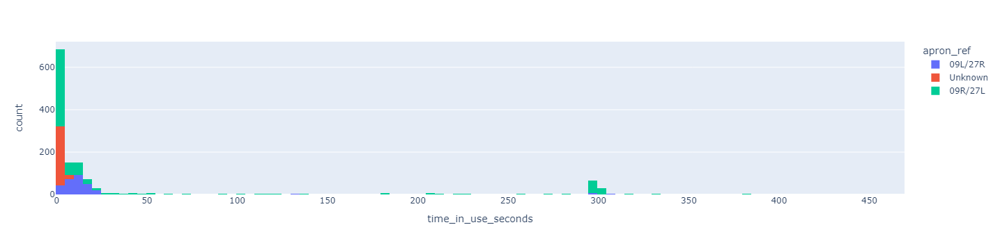

In [48]:
px.histogram(df_rwy,x='time_in_use_seconds', color = 'apron_ref', nbins=100)

In [49]:
for hour in df_tmp.hour.unique():
    f = df_aggregated_clean.id.isin(df_tmp[df_tmp.hour==hour].id.unique())
    tmp = df_aggregated_clean[f]
    fig = visualize_gantt(tmp, date=f'1 May 2024 between {hour}:00 and {hour+1}:00')
    fig.write_html(f'apron_flow_gantt_diagrams/{apt}_apron_flow_gantt_2024-05-01_{"{:02d}".format(hour)}h00m00s.html')

/tmp/ipykernel_194/3806003825.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_194/3806003825.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



FileNotFoundError: [Errno 2] No such file or directory: 'apron_flow_gantt_diagrams/EGLL_apron_flow_gantt_2024-05-01_15h00m00s.html'

Rules: 

- If one taxiway or runway period is completely within another taxiway or runway period: then the overlapping taxiway period is valid only.
- If one parking_position period is completely within another taxiway period: then the overlapping taxiway period is valid only, EXCEPT, when the taxiway period and runway period end or start at the same time.  

In [57]:
from HexAeroPy import h3maps
apron = pd.read_parquet(f'data/apron_hex/h3_res_12_apron_{apt}.parquet')
df['id'] = df['icao24'] + '_' + df['callsign']
df_f = df[df['id'] == '4075ff_BAW712T']
df_f = df_f.h3.geo_to_h3(resolution = 12, lat_col = 'lat', lng_col = 'lon').reset_index()
apron['is_detected'] = apron.hex_id.isin(df_f.h3_12.to_list())

In [58]:
apron['is_detected'] = apron['is_detected'].astype(int)*5000

In [59]:
apron['is_detected'] = apron['is_detected'].replace(0, None)

In [60]:
dic = {'runway':1000, 'taxiway':2000, 'parking_position':3000}
apron['aeroway_map'] = apron['aeroway'].apply(lambda l: dic[l])

apron['is_detected'] = apron['is_detected'].fillna(apron['aeroway_map'])

/tmp/ipykernel_194/1929336610.py:4: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [62]:
fig = h3maps.choropleth_map(apron, column_name="is_detected", border_color='black', fill_opacity=0.7, color_map_name="Reds", initial_map=None, initial_location=[apron.hex_latitude.values[0], apron.hex_longitude.values[0]], initial_zoom=15, tooltip_columns=['aeroway', 'ref', 'id'])

import folium

def add_trajectory(map_object, dataframe):
    """
    Adds an aircraft trajectory to a Folium map based on coordinates in a Pandas DataFrame.
    This includes drawing a polyline for the trajectory and individual markers for each point,
    with a tooltip displaying the 'time'.

    Parameters:
    - map_object: Folium Map instance where the trajectory will be added.
    - dataframe: Pandas DataFrame containing the trajectory coordinates with columns 'lat', 'lon',
                 and 'time' for the tooltip.
    """
    # Extracting coordinates and times from DataFrame
    coordinates = dataframe[['lat', 'lon']].values.tolist()
    times = dataframe['time'].tolist()

    # Adding a PolyLine to the map to represent the trajectory
    folium.PolyLine(coordinates, color="blue", weight=2.5, opacity=1).add_to(map_object)

    # Adding markers for each point with a tooltip displaying the time
    for (lat, lon), time in zip(coordinates, times):
        folium.CircleMarker(
            [lat, lon],
            radius=3, # Size of the dot
            color="red",
            fill=True,
            fill_color="red",
            fill_opacity=1,
            tooltip=f'Time: {time}'
        ).add_to(map_object)


add_trajectory(fig, df_f)

fig

Colour column min value 1000, max value 5000, mean value 1950.5335428902308
Hexagon cell count: 8357


In [ ]:
fig.save('flight_3c675a_DLH886.html')

In [ ]:
df_essa_apron

In [ ]:
df_essa_apron

In [ ]:
df_essa_apron.groupby(['icao24', 'callsign', 'apron_id', 'apron_aeroway', 'apron_name'])['time'].agg(['min', 'max'])


In [ ]:
import 

In [ ]:
logging.warning("test")

In [ ]:
import h3pandas
h3pandas.__version__

In [ ]:
import pandas as pd
min([5 , 10])

In [ ]:
min?

In [ ]:
print("test")

In [ ]:
apron = apron[['hex_id', 'aeroway', 'id', 'ref']]
apron.columns = ['apron_' + x for x in apron.columns]
#apron['apron_name'] = apron['apron_name'].fillna('')
apron['apron_ref'] = apron['apron_ref'].fillna('')

# Add link to the element in question
apron['apron_id_link'] = 'https://www.openstreetmap.org/way/' + apron['apron_id'].astype(str).fillna('')

# Add apron info
df_essa_apron = df_essa.merge(apron, left_on = 'h3_12', right_on='apron_hex_id')

# Assuming df_essa_apron is your original DataFrame
# Step 1: Separate the different types of apron_aeroway
runway_df = df_essa_apron[df_essa_apron['apron_aeroway'] == 'runway']
taxiway_df = df_essa_apron[df_essa_apron['apron_aeroway'] == 'taxiway']
parking_position_df = df_essa_apron[df_essa_apron['apron_aeroway'] == 'parking_position']

# Step 2: Identify 'runway' and 'taxiway' entries to keep (without duplicates)
# Sort by 'apron_aeroway' to prioritize 'runway' over 'taxiway' and then drop duplicates
priority_df = pd.concat([runway_df, taxiway_df], ignore_index=True)
priority_df['sort_key'] = priority_df['apron_aeroway'].replace({'runway': 0, 'taxiway': 1})
priority_df.sort_values(by=['icao24', 'callsign', 'time', 'sort_key'], inplace=True)
priority_df.drop_duplicates(subset=['icao24', 'callsign', 'time'], keep='first', inplace=True)
priority_df.drop('sort_key', axis=1, inplace=True)

# Step 3: Exclude 'parking_position' entries if they have the same timestamp, icao24, and callsign as any 'runway'/'taxiway' entry
# Note that 'parking_position' entries are only compared within their own group
#mask = parking_position_df[['icao24', 'callsign', 'time']].isin(priority_df[['icao24', 'callsign', 'time']].to_dict('list')).all(axis=1)
#filtered_parking_position_df = parking_position_df[~mask]

# Step 4: Concatenate all parts back together
df_essa_apron_final = pd.concat([priority_df, parking_position_df], ignore_index=True)
df_essa_apron_final = df_essa_apron
# The final_df now contains:
# - 'runway' entries preferred over 'taxiway' when both have the same timestamp, icao24, and callsign
# - 'parking_position' entries that don't have a conflicting timestamp, icao24, and callsign with 'runway' or 'taxiway'
# - Duplicates within 'parking_position' are kept if they have different ids


# Now df_essa_apron_final contains your desired result.

# Ensure the DataFrame is sorted
df_essa_apron_final.sort_values(by=['id', 'time'], inplace=True)

# Convert time column to datetime if it's not already
df_essa_apron_final['time'] = pd.to_datetime(df_essa_apron_final['time'])

# Function to assign track IDs within each group
def assign_track_ids(group):
    # Sort group just in case
    group = group.sort_values(by='time')
    
    # Calculate the time difference between each row and the next
    group['time_diff'] = group['time'].diff().dt.total_seconds().fillna(0)
    
    # Identify rows where a new track starts
    group['new_track'] = (group['time_diff'] > (30 * 60)) # Assuming a new track if the gap is more than 30 minutes
    
    # Cumulative sum to assign a new ID each time 'new_track' is True
    group['track_id'] = group['new_track'].cumsum()
    
    return group

# Apply the function to each group of 'id' and 'apron_id'
df_essa_apron_final = df_essa_apron_final.groupby(['id', 'apron_id']).apply(assign_track_ids)

# Optional: drop the intermediate columns if they are no longer needed
df_essa_apron_final.drop(columns=['time_diff', 'new_track'], inplace=True)


# Groupby
df_essa_apron = df_essa_apron_final.groupby(['icao24', 'callsign', 'apron_id', 'apron_id_link', 'apron_aeroway','apron_ref'])['time'].agg(["min", "max"]).reset_index()

# Add time in use for each element
df_essa_apron['time_in_use'] = df_essa_apron['max'] - df_essa_apron['min']
df_essa_apron['time_in_use_seconds'] = df_essa_apron['time_in_use'].dt.total_seconds()

# Sort in time
df_essa_apron = df_essa_apron.sort_values(['icao24', 'callsign', 'min'])

# Rename
df_essa_apron = df_essa_apron.rename({'min':'entry_time', 'max':'exit_time'},axis=1)

# Make str
df_essa_apron['entry_time'] = df_essa_apron['entry_time'].apply(str)
df_essa_apron['exit_time'] = df_essa_apron['exit_time'].apply(str)

df_essa_apron = df_essa_apron[['icao24', 'callsign','apron_id', 'apron_id_link', 'apron_aeroway', 'apron_ref', 'entry_time', 'exit_time', 'time_in_use_seconds']]

df_essa_apron.to_excel(f'apron_test_{apt}_2024-01-01.xlsx', index=False)